# Showcasing various uses of EVforecaster

In [1]:
from EVforecaster.EVforecasterUser import EVforecaster
from scipy.stats import mannwhitneyu
import numpy as np
import pandas as pd

import logging

logging.disable(logging.CRITICAL + 1)

/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand


## Aggregate weekly forecast using all weeks of 2017, comparing with all weeks of ECA

In [2]:
agg_vs_agg = EVforecaster(travel_years=[2017])

All required files are present.
Please inspect parameters in EVforecaster/Modules/config.py

SOC_charging_prob
<function SOC_charging_prob at 0x7d16186f9620>

battery_size_bev
[[(25, 269)], [1]]

battery_size_phev
[[(13.8, 363)], [1]]

car_types
[['PHEV', 'BEV'], [0.7, 0.3]]

charger_likelihood
{'work': 0, 'other': 0, 'home': 1}

charging_rates
{1: [[3.6], [1]], 2: [[11], [1]], 3: [[3, 7], [0.5, 0.5]]}

home_shift
60

min_stop_time_to_charge
120

root_folder
/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand

For more information please refer to EVforecaster/Modules/config.py
No merged dataset found
Ceating Dataset...


/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand/EVforecasterModules/data_loaders.py:121: DtypeWarning: Columns (17,28,34,35,36,37,39) have mixed types. Specify dtype option on import or set low_memory=False.
  household_df = pd.read_csv(household_path, sep="\t")


Successfully exported dataset to /home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand/data/2017-2017-merged.pkl


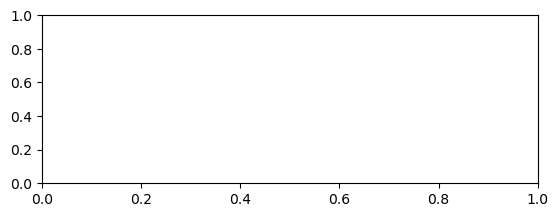

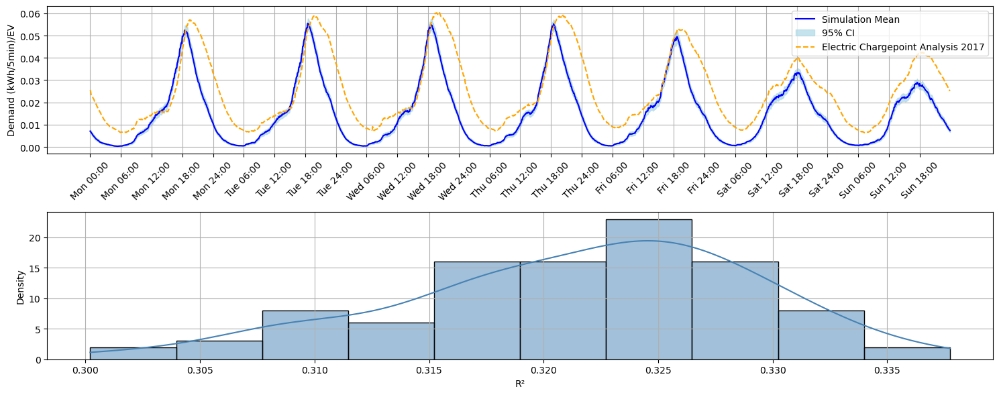

In [3]:

results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=list(range(1,53)),
                              home_shift=0,
                              experiment_name="100sims_agg_vs_agg_homeshift0",
                              ECA_overlay=list(range(39,53)))


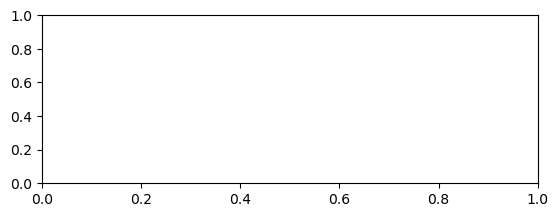

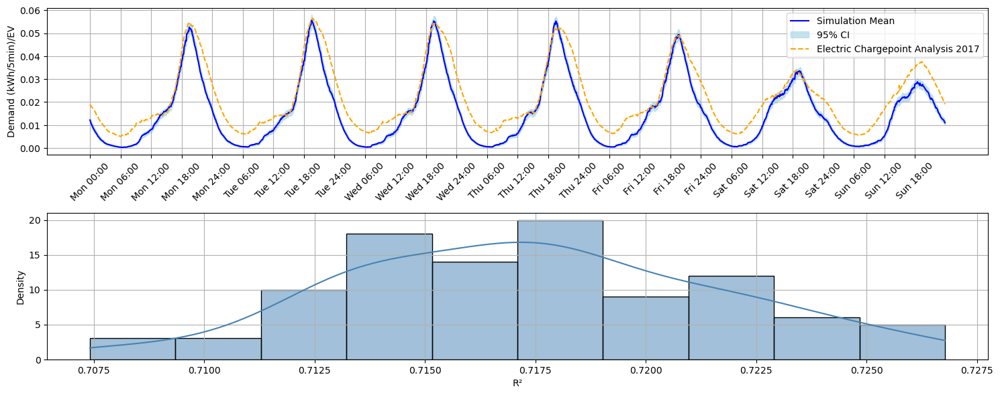

In [4]:
results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=list(range(1,53)),
                              home_shift=60,
                              experiment_name="100sims_agg_vs_agg_homeshift60",
                              ECA_overlay=[40])



### Create a model that forecasts each week individualy and compare with overall forecaster

In [ ]:

results = {"week": [],
           "Model1 mean R2": [],
           "Model1 sd R2": [],
           "Model2 mean R2": [],
           "Model2 sd R2": [],
           "MannWU p val": []}

for week in list(range(39,53)):
    
    # Week-by-week model

    results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_week_{week}_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_1 = results_dict["R2"]

    # Overall model


    results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_agg_vs_agg_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_2 = results_dict["R2"]

    #print(f"Mann-Whitney U test")

    stat, p = mannwhitneyu(R2_1, R2_2, alternative='two-sided')
    #print(f"Mean (sd) R2 for week-by-week model, when forecasting week {week} of ECA: {np.mean(R2_1):.2f} ({np.std(R2_1):.2f})")
    #print(f"Mean (sd) R2 for overall model, when forecasting week {week} of ECA: {np.mean(R2_2):.2f} ({np.std(R2_2):.2f})")
    #print(f"Mann–Whitney U test statistic: {stat:.4f}, p-value: {p:.4f}")
    results["week"].append(week)
    
    results["Model1 mean R2"].append(np.mean(R2_1))
    results["Model2 mean R2"].append(np.mean(R2_2))

    results["Model1 sd R2"].append(np.std(R2_1))
    results["Model2 sd R2"].append(np.std(R2_2))

    results["MannWU p val"].append(np.round(p, 3))

results_df = pd.DataFrame(results)

results_df

### Testing Model with more data

In [2]:
agg_vs_agg_full_data = EVforecaster(travel_years=list(range(2012, 2018)))

All required files are present.
Please inspect parameters in EVforecaster/Modules/config.py

SOC_charging_prob
<function SOC_charging_prob at 0x7f8ee22e16c0>

battery_size_bev
[[(25, 269)], [1]]

battery_size_phev
[[(13.8, 363)], [1]]

car_types
[['PHEV', 'BEV'], [0.7, 0.3]]

charger_likelihood
{'work': 0, 'other': 0, 'home': 1}

charging_rates
{1: [[3.6], [1]], 2: [[11], [1]], 3: [[3, 7], [0.5, 0.5]]}

home_shift
60

min_stop_time_to_charge
120

root_folder
/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand

For more information please refer to EVforecaster/Modules/config.py
Merged dataset found. Ready to forecast!


In [23]:
agg_vs_agg_full_data.df.value_counts("TravelYear")

TravelYear
2012    135372
2016    111467
2013    110678
2014    108482
2015    106427
2017    100692
Name: count, dtype: int64

In [21]:
agg_vs_agg_full_data.df.columns

Index(['DayID', 'TripID', 'IndividualID', 'HouseholdID', 'TravDay', 'JourSeq',
       'TripStart', 'TripEnd', 'TripDisExSW', 'TripStartLoc', 'TripEndLoc',
       'TripType', 'TripStartRolling', 'TripEndRolling', 'TravelYear',
       'TravelWeekDay_B01ID', 'TWSWeek', 'TripStartRolling+1', 'TimeEndLoc',
       'Distance+1', 'WeekDayDiff', 'WeekRollover', 'TWSWeekNew'],
      dtype='object')

In [22]:
## 2017 data

data2017 = agg_vs_agg_full_data.df[
    (agg_vs_agg_full_data.df["TravelYear"] == 2017) &
    ((agg_vs_agg_full_data.df["TripStartLoc"] == 3) | (agg_vs_agg_full_data.df["TripEndLoc"] == 3))
]


data2017.groupby("TWSWeekNew").count()

,DayID,TripID,IndividualID,HouseholdID,TravDay,JourSeq,TripStart,TripEnd,TripDisExSW,TripStartLoc,...,TripStartRolling,TripEndRolling,TravelYear,TravelWeekDay_B01ID,TWSWeek,TripStartRolling+1,TimeEndLoc,Distance+1,WeekDayDiff,WeekRollover
TWSWeekNew,,,,,,,,,,,,,,,,,,,,,
1,1157,1157,1157,1157,1157,1157,1157,1157,1157,1157,...,1157,1157,1157,1157,1157,1078,1078,1078,1012,1157
2,1834,1834,1834,1834,1834,1834,1834,1834,1834,1834,...,1834,1834,1834,1834,1834,1682,1682,1682,1688,1834
3,1933,1933,1933,1933,1933,1933,1933,1933,1933,1933,...,1933,1933,1933,1933,1933,1794,1794,1794,1785,1933
4,1923,1923,1923,1923,1923,1923,1923,1923,1923,1923,...,1923,1923,1923,1923,1923,1770,1770,1770,1772,1923
5,1866,1866,1866,1866,1866,1866,1866,1866,1866,1866,...,1866,1866,1866,1866,1866,1726,1726,1726,1745,1866
6,1760,1760,1760,1760,1760,1760,1760,1760,1760,1760,...,1760,1760,1760,1760,1760,1614,1614,1614,1620,1760
7,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,...,1481,1481,1481,1481,1481,1352,1352,1352,1363,1481
8,1712,1712,1712,1712,1712,1712,1712,1712,1712,1712,...,1712,1712,1712,1712,1712,1579,1579,1579,1562,1712
9,1755,1755,1755,1755,1755,1755,1755,1755,1755,1755,...,1755,1755,1755,1755,1755,1617,1617,1617,1614,1755


In [ ]:
# Getting an overall forecast

results_dict = agg_vs_agg_full_data.generate_forecasts(
                              N_sims=100,
                              weeks=list(range(1,53)),
                              home_shift=60,
                              experiment_name="100sims_agg_vs_agg_full_data_homeshift60",
                              ECA_overlay=list(range(39,53)),
                              )

### Now trying aggregate model overall vs week-by-week


In [ ]:

results = {"week": [],
           "Model1 mean R2": [],
           "Model1 sd R2": [],
           "Model2 mean R2": [],
           "Model2 sd R2": [],
           "MannWU p val": []}

for week in list(range(39,53)):
    
    # Week-by-week model

    results_dict = agg_vs_agg_full_data.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_week_{week}_full_data_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_1 = results_dict["R2"]

    # Overall model


    results_dict = agg_vs_agg_full_data.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_agg_vs_agg_full_data_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_2 = results_dict["R2"]

    #print(f"Mann-Whitney U test")

    stat, p = mannwhitneyu(R2_1, R2_2, alternative='two-sided')
    #print(f"Mean (sd) R2 for week-by-week model, when forecasting week {week} of ECA: {np.mean(R2_1):.2f} ({np.std(R2_1):.2f})")
    #print(f"Mean (sd) R2 for overall model, when forecasting week {week} of ECA: {np.mean(R2_2):.2f} ({np.std(R2_2):.2f})")
    #print(f"Mann–Whitney U test statistic: {stat:.4f}, p-value: {p:.4f}")
    results["week"].append(week)
    
    results["Model1 mean R2"].append(np.mean(R2_1))
    results["Model2 mean R2"].append(np.mean(R2_2))

    results["Model1 sd R2"].append(np.std(R2_1))
    results["Model2 sd R2"].append(np.std(R2_2))

    results["MannWU p val"].append(np.round(p, 3))

results_df = pd.DataFrame(results)

results_df

### Final test - dataset size - week-by-week model

/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand/EVforecasterModules/StatisticalTesting.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 6))


,week,Model1 mean R2,Model1 sd R2,Model2 mean R2,Model2 sd R2,MannWU p val
0,39,0.021040,0.022413,-0.171853,0.080684,0.000
1,40,0.288656,0.016985,0.121871,0.060006,0.000
2,41,0.362444,0.014853,0.285908,0.043295,0.000
3,42,0.327012,0.015297,0.260444,0.040018,0.000
4,43,0.395964,0.012352,0.190647,0.037128,0.000
5,44,0.179107,0.016028,0.075162,0.041570,0.000
6,45,0.123141,0.016165,0.026144,0.037174,0.000
7,46,0.095470,0.014789,-0.058174,0.045064,0.000
8,47,0.063902,0.015757,-0.015888,0.042218,0.000
9,48,-0.011056,0.014892,-0.082079,0.045416,0.000


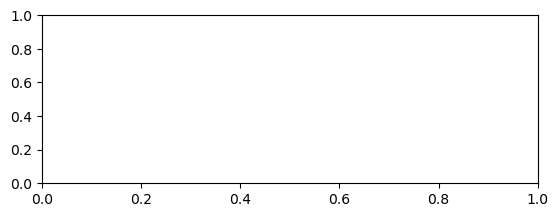

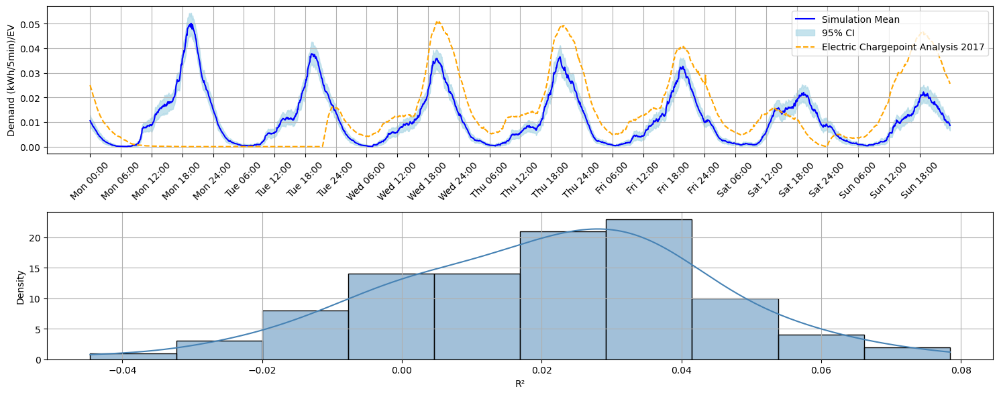

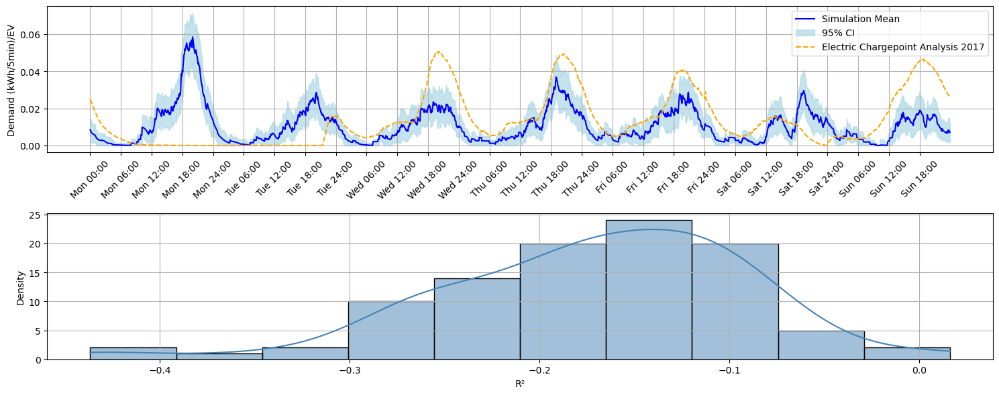

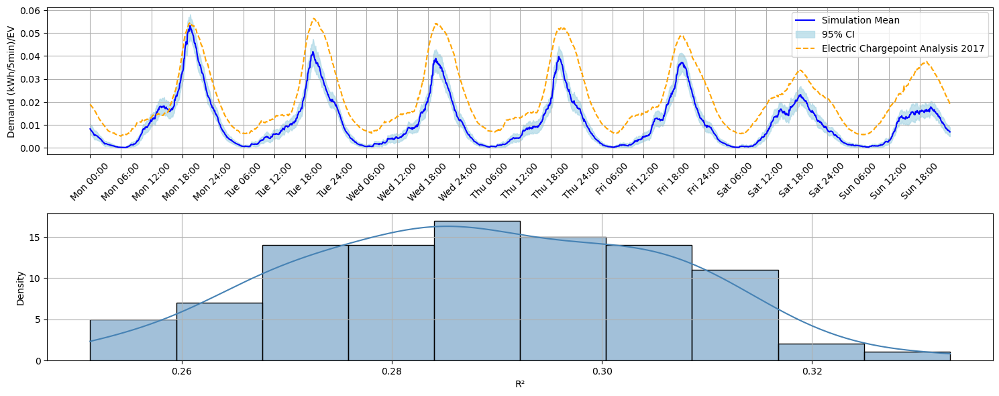

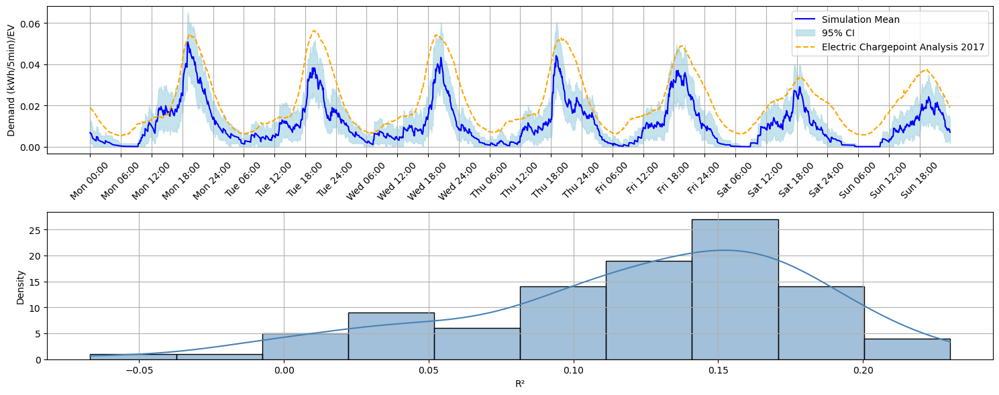

...

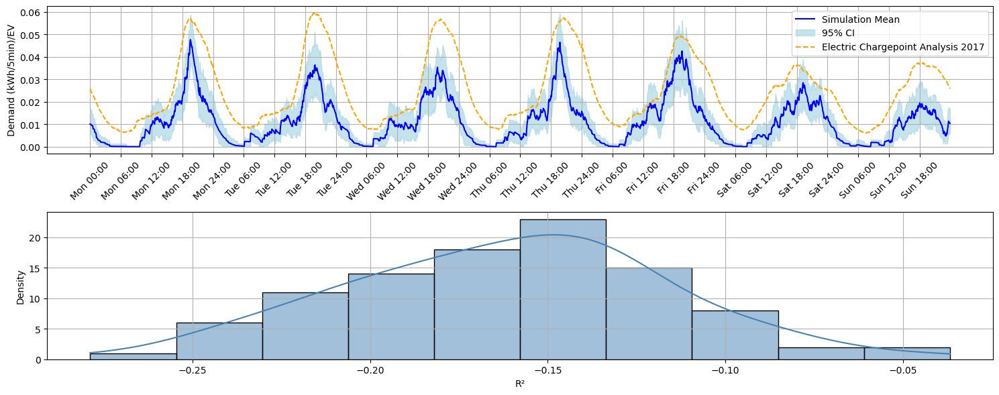

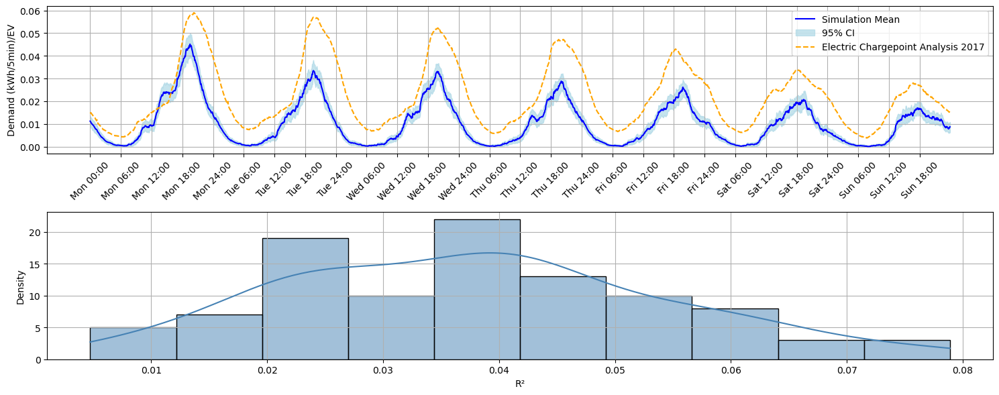

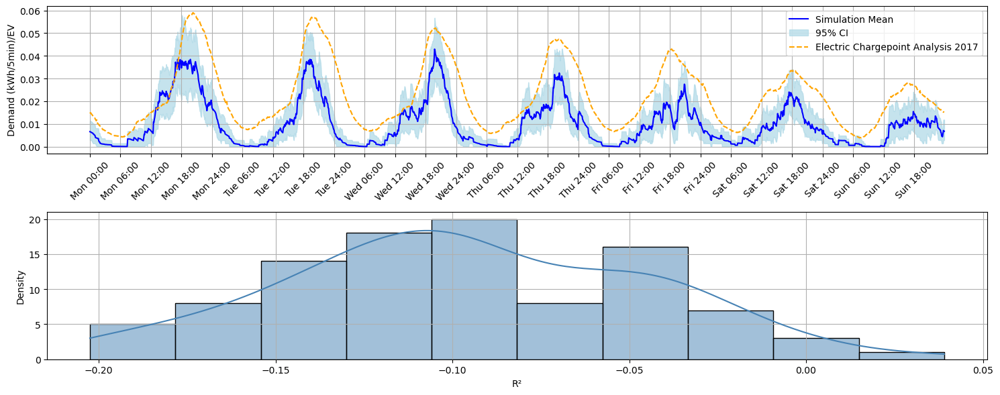

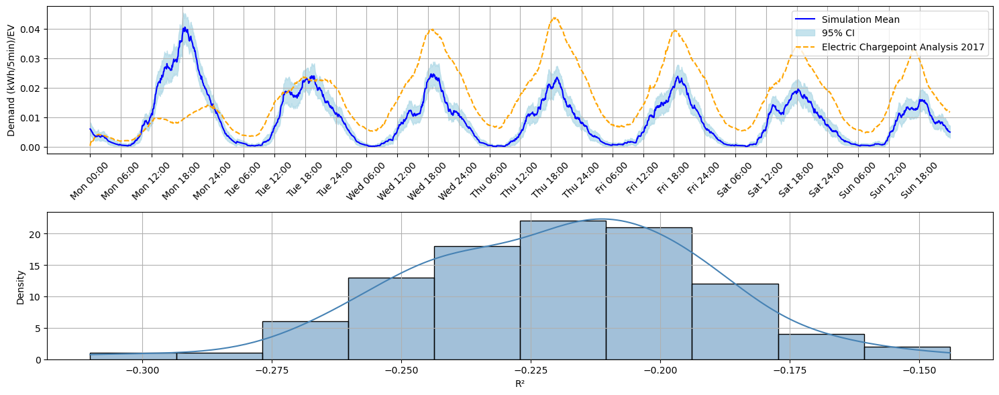

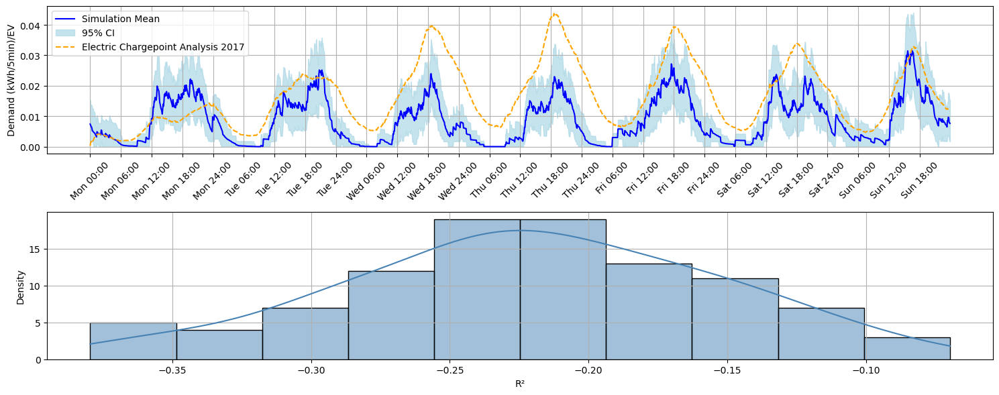

In [14]:
results = {"week": [],
           "Model1 mean R2": [],
           "Model1 sd R2": [],
           "Model2 mean R2": [],
           "Model2 sd R2": [],
           "MannWU p val": []}

for week in list(range(39,53)):
    
    # Week-by-week model

    results_dict = agg_vs_agg_full_data.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_week_{week}_full_data_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_1 = results_dict["R2"]

    # Overall model


    results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=[week],
                              home_shift=60,
                              experiment_name=f"100sims_week_{week}_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_2 = results_dict["R2"]

    #print(f"Mann-Whitney U test")

    stat, p = mannwhitneyu(R2_1, R2_2, alternative='two-sided')
    #print(f"Mean (sd) R2 for week-by-week model, when forecasting week {week} of ECA: {np.mean(R2_1):.2f} ({np.std(R2_1):.2f})")
    #print(f"Mean (sd) R2 for overall model, when forecasting week {week} of ECA: {np.mean(R2_2):.2f} ({np.std(R2_2):.2f})")
    #print(f"Mann–Whitney U test statistic: {stat:.4f}, p-value: {p:.4f}")
    results["week"].append(week)
    
    results["Model1 mean R2"].append(np.mean(R2_1))
    results["Model2 mean R2"].append(np.mean(R2_2))

    results["Model1 sd R2"].append(np.std(R2_1))
    results["Model2 sd R2"].append(np.std(R2_2))

    results["MannWU p val"].append(np.round(p, 3))

results_df = pd.DataFrame(results)

results_df

### Final test - dataset size - overall model

/home/trapfishscott/Cambridge24.25/EnergyThesis/SimulatingEVDemand/EVforecasterModules/StatisticalTesting.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 6))


,week,Model1 mean R2,Model1 sd R2,Model2 mean R2,Model2 sd R2,MannWU p val
0,39,-0.013123,0.013269,-0.010615,0.005368,0.033
1,40,0.717409,0.004254,0.734125,0.001751,0.000
2,41,0.745735,0.004183,0.761658,0.001704,0.000
3,42,0.754053,0.004044,0.768581,0.001592,0.000
4,43,0.780472,0.004028,0.796520,0.001655,0.000
5,44,0.633052,0.005615,0.655115,0.002166,0.000
6,45,0.564745,0.005323,0.586616,0.002188,0.000
7,46,0.581282,0.005222,0.602968,0.002139,0.000
8,47,0.547432,0.005393,0.568714,0.002209,0.000
9,48,0.476649,0.005591,0.497559,0.002340,0.000


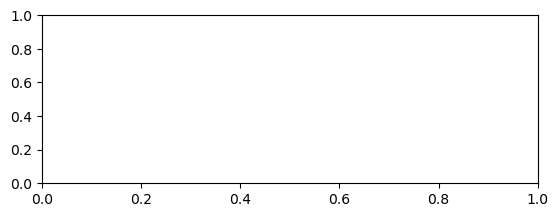

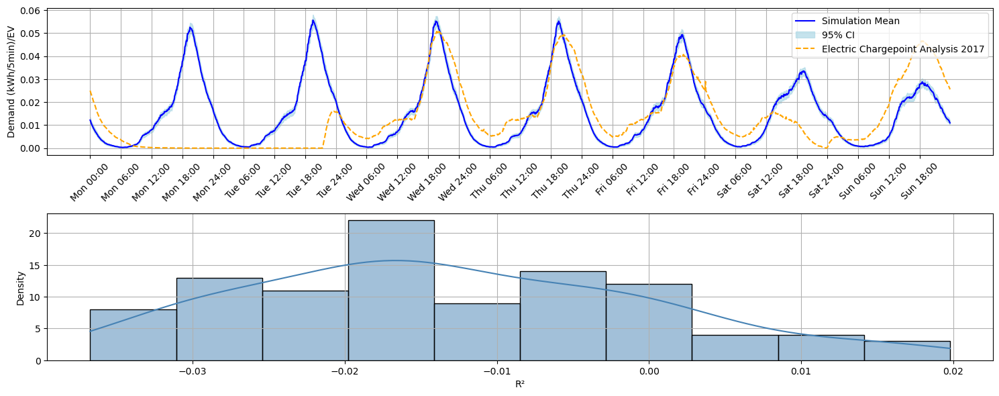

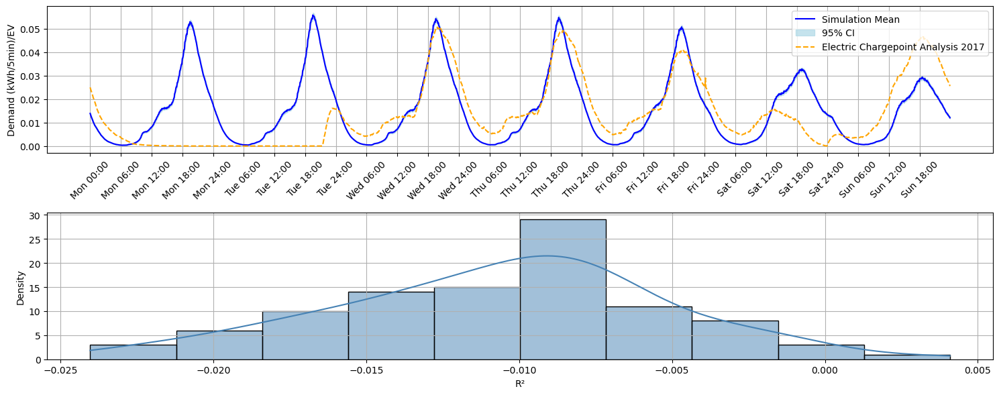

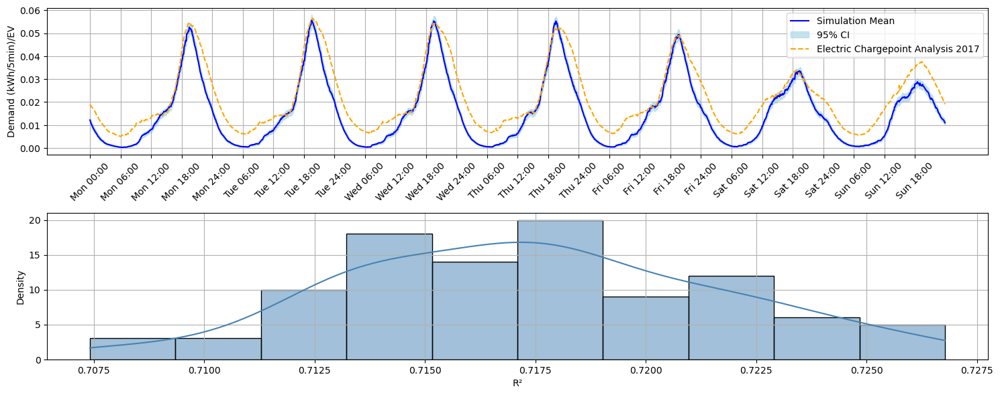

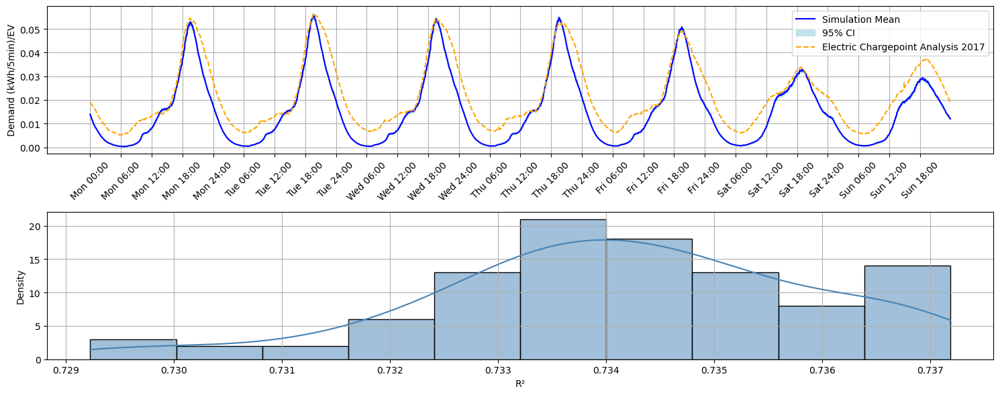

...

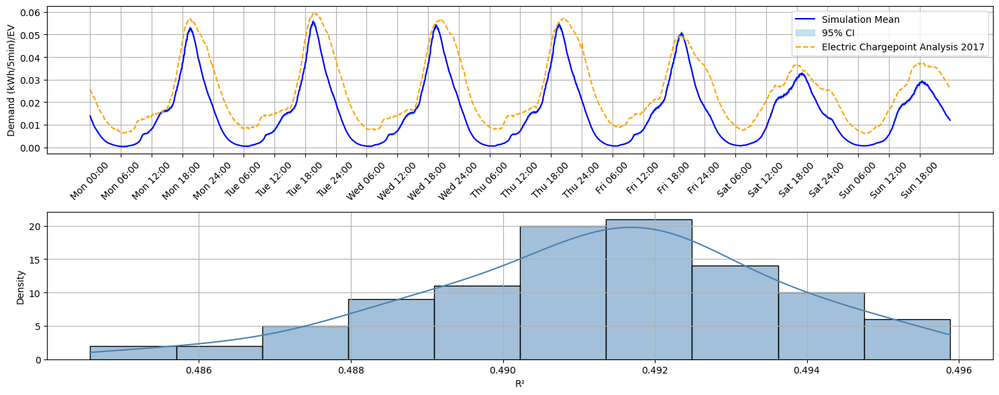

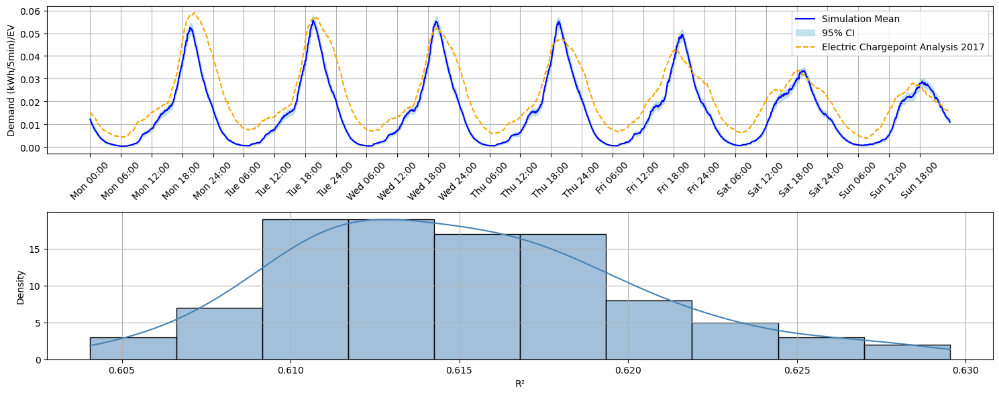

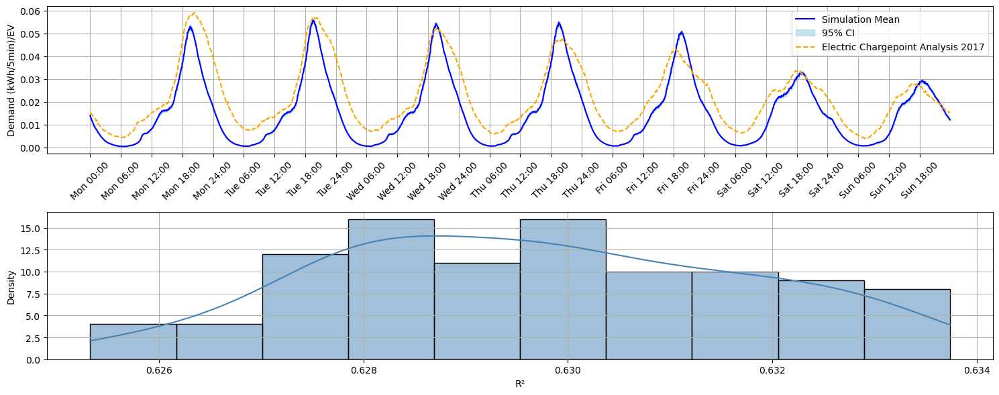

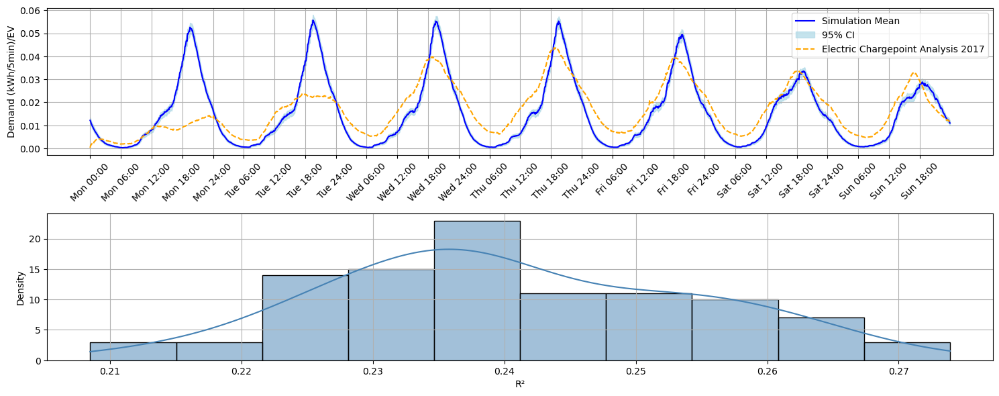

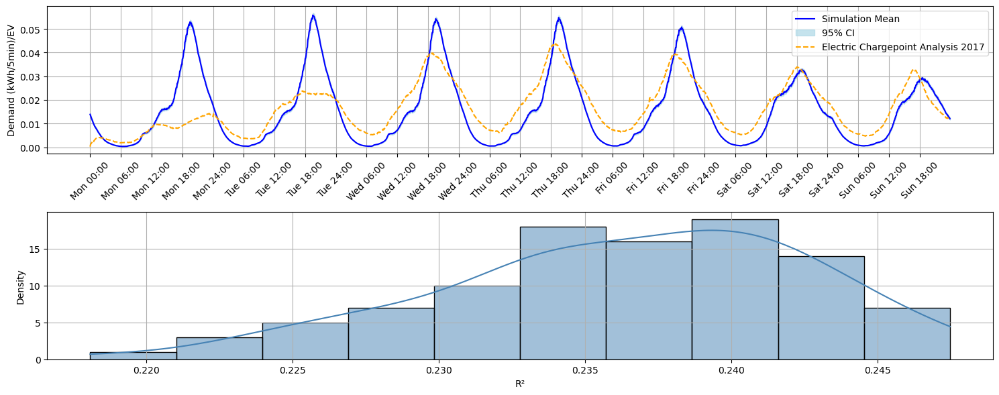

In [ ]:
results = {"week": [],
           "Model1 mean R2": [],
           "Model1 sd R2": [],
           "Model2 mean R2": [],
           "Model2 sd R2": [],
           "MannWU p val": []}

for week in list(range(39,53)):
    
    # Week-by-week model

    results_dict = agg_vs_agg_full_data.generate_forecasts(N_sims=100,
                              weeks=list(range(39,53)),
                              home_shift=60,
                              experiment_name=f"100sims_agg_vs_agg_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_1 = results_dict["R2"]

    # Overall model

    results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=list(range(39,53)),
                              home_shift=60,
                              experiment_name=f"100sims_agg_vs_agg_full_data_homeshift60",
                              ECA_overlay=[week],
                              plot=False)
    
    R2_2 = results_dict["R2"]

    #print(f"Mann-Whitney U test")

    stat, p = mannwhitneyu(R2_1, R2_2, alternative='two-sided')
    #print(f"Mean (sd) R2 for week-by-week model, when forecasting week {week} of ECA: {np.mean(R2_1):.2f} ({np.std(R2_1):.2f})")
    #print(f"Mean (sd) R2 for overall model, when forecasting week {week} of ECA: {np.mean(R2_2):.2f} ({np.std(R2_2):.2f})")
    #print(f"Mann–Whitney U test statistic: {stat:.4f}, p-value: {p:.4f}")
    results["week"].append(week)
    
    results["Model1 mean R2"].append(np.mean(R2_1))
    results["Model2 mean R2"].append(np.mean(R2_2))

    results["Model1 sd R2"].append(np.std(R2_1))
    results["Model2 sd R2"].append(np.std(R2_2))

    results["MannWU p val"].append(np.round(p, 3))

results_df = pd.DataFrame(results)

results_df

### Exploring BIG O

In [ ]:
results_dict = agg_vs_agg.generate_forecasts(N_sims=100,
                              weeks=list(range(1,53)),
                              home_shift=60,
                              experiment_name="bigO",
                              ECA_overlay=None)

In [16]:
results_dict = agg_vs_agg_full_data.generate_forecasts(N_sims=100,
                              weeks=list(range(1,53)),
                              home_shift=60,
                              experiment_name="bigO",
                              ECA_overlay=None)

KeyboardInterrupt: 